In my previous tutorial [PCA: from newbie to ninja](http://pietromarchesi.net/pca-from-newbie-to-ninja.html#pca-from-newbie-to-ninja) I went through a bit of the theory behind PCA and showed how you can write a simple implementation in Python, using the famous Iris dataset as an example. 

However, neural data generally has a more complex structure than the Iris dataset, because we have __an additional dimension: _time___. Consequently, there are different ways in which we can use PCA to reduce its dimensionality. In this tutorial, I will present what I think are the main strategies to run PCA on neural data, discuss their strengths and weaknesses, and show you some cool ways to visualize the results. As an example, I will use a recording session of a population of neurons in mouse V1 obtained with chronic calcium imaging where the animals are presented with oriented drifting gratings. 

## Contents

### [Intro](#intro)
- [Why PCA?](#whypca)
- [Neural data](#neuraldata)
- [PCA on neural data: the different forms](#theforms)
- [A note on preprocessing](#preprocessing)

### [PCA on neural data: an example](#example)
- [The dataset](#thedataset)
- [Trial-response PCA](#trialresponse)
- [Trial-averaged PCA](#trialaveraged)
- [Trial-concatenated PCA](#trialconcatenated)
- [Averaged-concatenated PCA](#averagedconcatenated)

### [More on visualization](#visualization)
- [Animated scatter](#animatedscatter)
- [3D PCA trajectories](#trajectories)
- [Animated PCA trajectories](#animatedtrajectories)
- [Animated PCA trajectories of single trials](#animatedtrajectoriessingle)

### [Outro](#single)

<a id='intro' ></a>
# Intro

<a id='whypca' ></a>
## Why PCA?
Admittedly, there are many fancier ways to do dimensionality reduction compared to vanilla PCA. Starting with the many flavors of PCA, such as Kernel PCA, we then have the whole suite of manifold learning algorithms (Isomap, Locally Linear Embedding, t-SNE, etc.), arriving to more modern tools like auto-encoders, and finally dimensionality reduction methods tailored specifically to neural data, such as Gaussian-Process Factor Analysis (GPFA), tensor component analysis (TCA), demixed principal component analysis (dPCA), sequential non-negative matrix factorization (seqNMF).    

So why am I still talking about PCA? The truth is, whenever I am interested in performing dimensionality reduction on a new dataset, I generally start with PCA before moving on to more advanced methods. In my experience this is a good idea for a number of reasons:
1. Chances are, __you understand PCA better than something more advanced__. This means you will be able to clearly interpret your results, and it also means more freedom to play around and experiment with it. Importantly, __your audience__ will also most likely know what you are talking about, which is always a good place to start.    
2. You most likely will have __access to a good implementation in your programming language__ of choice, which means it will be a matter of minutes to get it up and running (this may not always be the case for newer methods).  
3. There are virtually __no parameters you need to tinker with__, which makes the application very straightforward. With more advanced methods, you need to understand the impact of each parameter, and you may get different results for different settings. While this can be interesting for an extensive analysis, it may not be desirable if you are looking for a quick exploration of the data. 
4. PCA can serve as a __good baseline to judge the advantages of using a fancier method__. While it may certainly be the case that using a fancier method allows you to uncover properties of the data which PCA missed, it can also happen that the benefits of spending extra time and effort on a more advanced technique are not really worth it. So if you decide to move on to a fancier method, you are aware of the added value you are getting (or not) beyond simple PCA. 

<a id='neuraldata' ></a>
## Neural data
When I say neural data, I specifically mean the case where record the __activity of a population of neurons in parallel across a number of trials of potentially different types__. Trials can consist in the presentation of different type of stimuli, and a behavioral response of the animal may or may not be required. In the example we will look at, mice are presented with visual stimuli consisting of drifting gratings, and the trial types correspond to the different orientations of these gratings. This tutorial is also restricted to the case where __trials have roughly the same duration and stimulus-behavior sequence__, so that we could average the activity of neurons across trials. In experiments with freely-moving animals and self-paced behavior, this is of course not the case, which makes the application of most dimensionality reduction methods a lot more tricky. 

While of course these specifications, namely __parallel recording__, __trial structure__, and __fixed within-trial structure__, are not universal, they are very common in cognitive and systems neuroscience. Requiring fixed within-trial structure is probably the most restrictive condition, so perhaps I will dedicate a future tutorial specifically to this issue.  

But why make a separate tutorial for PCA on neural data? Didn't I already cover PCA in my previous tutorial? Well, almost. With respect to the Iris dataset, the main added complexity here comes from the fact that __neural data has an additional time dimension__: for every trial, the activity of the neurons is recorded at several time points, so several samples (activity at a given time point) are nested within a single trial. This opens up a few possibility as to how we can come up with data matrix $X$ on which to fit PCA. 

It is also important to distinguish between the __two different operations we perform when we say that we 'apply' PCA__. The first operation is where we __fit__ the PCA decomposition. That is, we take the eigenvectors of the covariance matrix and construct the linear transformation $C$ of dimensions $N \times Q$ (number of features by number of components). In the second operation, we __apply__ the linear transformation to reduce the dimensionality of a data matrix, by projecting (i.e. multiplying) the data matrix by the linear transformation $C$. As you can see, the matrix on which we fit PCA and the matrix we apply the transformation to _do not need to coincide_. All that matters is that they have the same number of features. 

In the drawing below I illustrate what I found to be the most common ways to use PCA on neural data, what I call the _trial-response_ form, _trial-averaged_ form, _trial-concatenated_ (or simply _long_) form, and the _averaged-concatenated_ (or simply _hybrid_) form. 

<a id='theforms' ></a>
## PCA on neural data: the different forms

![title](images/PCA_averaged_concatenated.svg)

### The _trial-response_ form
In the trial-response form, we reduce each trial to a single sample of shape $N \times 1$, where $N$ is the number of neurons we recorded. Then, we simply stack all these samples to produce a matrix $X_r$ of shape $N \times K$, where $K$ is the number of trials. There are several ways in which we can 'compress' the activity during the full trial to a single sample (the response). For instance, we can take the mean or maximum activity of each cell during the full trial (or during a certain epoch within the trial) as our response, and we can subtract a baseline from it (e.g. mean/maximum activity before stimulus) to focus our attention on the change in activity. 

#### Pros:
- Simple and intuitive.

#### Cons:
- Disregards a lot of potentially interesting information by compressing the time dimension.
- The choice of response measure may not be obvious, and may influence the result. 


### The _trial-averaged_ form
In the trial-averaged form, we first average all trials of each type together, concatenate the trial averages, and then apply PCA to the resulting matrix.

#### Pros:
- Maintains a time dimension, allowing us to see the evolution of activity in the course of the trial.  

#### Cons:
- Partially supervised.

### The _trial-concatenated_ (long) form
In the trial-concatenated form, we concatenate all trials, and apply PCA to the resulting matrix $X_l$, which has shape of shape $N \times TK$ (number of neurons by number of time points times number of trials).

#### Pros:
- Fully unsupervised. 
- Performs the dimensionality reduction at the level of single trials, so we get an idea of trial-to-trial variability in the reduction we obtain. 

#### Cons:
- More sensitive to noise, potentially less able to pick up effects of interest. 


### The _averaged-concatenated_ (hybrid) form
In the averaged-concatenated form, we _fit_ PCA on the concatenated trial averages, like in the trial-averaged form, and then _apply_ it to the matrix of concatenated trials, like in the trial-concatenated form. 

#### Pros:
- The decomposition is more sensitive to the effect of interest (difference between trial types).
- Performs the dimensionality reduction at the level of single trials.

#### Cons:
- Partially supervised. 

<a id='preprocessing' ></a>
## A note on preprocessing
In my [PCA tutorial](http://pietromarchesi.net/pca-from-newbie-to-ninja.html#pca-from-newbie-to-ninja) I mentioned that we always want to center our data (i.e. subtract the mean from each feature) before running PCA. In the context of neural data, in my experience this is not always enough. In fact, what often happens, is that __some neurons that fire a _lot_ more than others, and they tend to monopolize the variance that PCA is trying to capture__. Suppose we have a neuron which, after stimulus presentation, increases its firing from a baseline of 5 Hz to 6 Hz, and another one which increases firing from 50 Hz to 60 Hz. In both cases, the percentage change in firing is 20% ($100 \times \frac{6-5}{5}$ or $100 \times \frac{60-50}{50}$), however, PCA will __not__ give the same importance to these neurons. 

Let's code up a quick example. We begin by defining a function called `center` which accepts an array $X$ of shape $\#\,\mathrm{features} \times \#\,\mathrm{samples}$ and returns an array of the same shape where each row is mean-subtracted (has mean zero). This function is nothing more than a thin wrapper around [Scikit-learn's `StandardScaler`](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html) which allows us to scale our arrays without always having to manually initialize the scaler and remember to transpose our array (the `StandardScaler` assumes that the features are on the columns, whereas in our data they are on the rows).

In [1]:
import numpy as np
from sklearn.preprocessing import StandardScaler

def center(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=True, with_std=False)
    Xc = ss.fit_transform(X.T).T
    return Xc

X = np.array([[5., 6., 5.],
              [50., 60., 50.]]) # data array of shape n_neuron by n_time_points
X = center(X)
c = np.cov(X, rowvar=True) # covariance matrix
eig_vals, eig_vecs = np.linalg.eig(c)
srt = np.argsort(eig_vals)[::-1]
print('Sorted eigenvalues: \n{}'.format(eig_vals[srt]))
print('\nFirst eigenvector: \n{}'.format(eig_vecs[:, srt][:, 0]))

Sorted eigenvalues: 
[33.66666667  0.        ]

First eigenvector: 
[-0.09950372 -0.99503719]


As you can see from this example, the first component, which captures all of the variance (the second one has an eigenvalue of zero), assigns a weight of close to one to the second neuron, and virtually zero to the first (remember: the sign doesn't really matter). That is, PCA is 'listening' only to the second neuron, which due to its larger values is responsible for most of the overall variance. So potentially interesting modulations in the activity of the first neuron will almost inevitable be shadowed by the activity of the second one. While for certain types of data this may be absolutely fine, for the case of neural data this is problematic. We generally regard a 20% change in firing to be equally meaningful for neurons with both high and low baseline firing, and we would like our PCA to pay attention to all neurons, rather than focus only on a few high firing units. 

To address this issue, we can (in addition to centering), __scale__ the activity of our neurons such that it has unit variance, which is achieved by diving each neuron/feature by its standard deviation. This is what people call __standardizing__ (I also refer to it as z-scoring, see [Wikipedia](https://en.wikipedia.org/wiki/Standard_score)). Using Scikit-learn's `StandardScaler`, we can essentially copy our previous function and set the `with_std` parameter to `True`. Let's copy the same example, but this time standardize our data:

In [2]:
def z_score(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=True, with_std=True)
    Xz = ss.fit_transform(X.T).T
    return Xz

X = np.array([[5., 6., 5.],
              [50., 60., 50.]]) # data array of shape n_neuron by n_time_points
X = z_score(X)
c = np.cov(X, rowvar=True) # covariance matrix
eig_vals, eig_vecs = np.linalg.eig(c)
srt = np.argsort(eig_vals)[::-1]
print('Sorted eigenvalues: \n{}'.format(eig_vals[srt]))
print('\nFirst eigenvector: \n{}'.format(eig_vecs[:, srt][:, 0]))

Sorted eigenvalues: 
[3. 0.]

First eigenvector: 
[0.70710678 0.70710678]


Now the first eigenvector still captures all of the variance, but both neurons appear in it with the same weight (this makes sense, since once it is standardized, the activity of the two neurons is the same). 

As an alternative to z-scoring, the features of the data can be scaled to all be within a certain range (commonly between 0 and 1), what is known as [min-max scaling](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.minmax_scale.html#sklearn.preprocessing.minmax_scale). 
In my experience, __standardizing neural data always leads to better, more interpretable results than centering alone, whereas qualitative differences between z-scoring and min-max scaling are generally very small__. 

<a id='example' ></a>
# PCA on neural data: an example

<a id='thedataset' ></a>
## The dataset
The dataset I will use as an example was recorded by Jorrit Montijn and Guido Meijer and is published in this [Cell Reports paper](https://www.sciencedirect.com/science/article/pii/S2211124716309962#undfig1). Neural activity is recorded with two-photon calcium imaging in mouse V1. Each trial consists of the presentation of a bidirectionally drifting square-wave grating with one of eight orientations. That is, for a given orientation, the grating will drift in one direction for 1.5 seconds, and the in the opposite direction for another 1.5 seconds. The sampling frequency of the recording is 12.7 Hz, and the inter-trial interval (ITI) is of 5 seconds. The measure of neural activity we use is the $dF/F$ traces, which measure the changes in fluorescence related to calcium transients. 

In [5]:
import numpy as np
from orient.load_session import load_session
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage.filters import gaussian_filter1d
import warnings
warnings.filterwarnings("ignore")
from matplotlib.lines import Line2D
from mpl_toolkits.mplot3d import Axes3D

frames_pre_stim = 30
frames_post_stim = 30

data, events = load_session(index=8, activity_measure='dFoF',
                            data_path='/media/pietro/bigdata/neuraldata/NaturalOrient/',
                            frames_pre_stim=frames_pre_stim,
                            frames_post_stim=frames_post_stim)

rec_freq     = 12.7
trial_type   = data['trial_type']
trial_types  = data['trial_types']
trials       = data['trial']
start_stim   = events['start_stim'] / rec_freq
end_stim     = events['end_stim'] / rec_freq
session_type = data['session_type']
time         = events['time'] / rec_freq
trial_size   = trials[0].shape[1]
Nneurons     = trials[0].shape[0]

# list of arrays containing the indices of trials of each type (t_type_ind[0] contains the
# indices of trials of type trial_types[0])
t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:, 0] for t_type in trial_types]

Loading session /media/pietro/bigdata/neuraldata/NaturalOrient/20170424xyt05_ses_43_orientat.mat


The format of this data is fairly simple: 
- `trials` is a list of $K$ Numpy arrays of shape $N \times T$ (number of neurons by number of time points).
- `trial_type` is a list of length $K$ containing the type (i.e. the orientation) of every trial. 
- `trial_types` is a list containing the unique trial types (i.e. orientations) in ascending order. 

In [6]:
print('Number of trials: {}'.format(len(trials)))
print('Types of trials (orientations): {}'.format(trial_types)) 
print('Dimensions of single trial array (# neurons by # time points): {}'.format(trials[0].shape))
print('Trial types (orientations): {}'.format(trial_types))
print('Trial type of the first 3 trials: {}'.format(trial_type[0:3]))

Number of trials: 80
Types of trials (orientations): [  0.   22.5  45.   67.5  90.  112.5 135.  157.5]
Dimensions of single trial array (# neurons by # time points): (159, 103)
Trial types (orientations): [  0.   22.5  45.   67.5  90.  112.5 135.  157.5]
Trial type of the first 3 trials: [157.5   0.   90. ]


If you organize your data in the same way, you will be able to use the code that I will present throughout the tutorial.

As a last preparatory step, I will define some plotting parameters and utility functions which to add the stimulus shading and legend to the plots.

In [7]:
shade_alpha      = 0.2
lines_alpha      = 0.8
pal = sns.color_palette('husl', 9)
%config InlineBackend.figure_format = 'svg'

def add_stim_to_plot(ax):
    ax.axvspan(start_stim, end_stim, alpha=shade_alpha,
               color='gray')
    ax.axvline(start_stim, alpha=lines_alpha, color='gray', ls='--')
    ax.axvline(end_stim, alpha=lines_alpha, color='gray', ls='--')
    
def add_orientation_legend(ax):
    custom_lines = [Line2D([0], [0], color=pal[k], lw=4) for
                    k in range(len(trial_types))]
    labels = ['{}$^\circ$'.format(t) for t in trial_types]
    ax.legend(custom_lines, labels,
              frameon=False, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout(rect=[0,0,0.9,1])

<a id='trialresponse' ></a>
## Trial-response PCA
Here, I take as my response the mean activity during stimulus presentation, so that for each trial I end up with a single sample, and stack all the samples together. By calling the shortcut method `fit_transform`, I first fit PCA on `Xr`, and then use the extracted components to project `Xr`. 

Our projected data has as many dimensions as there are PCA components, so we can pick a few of the first dimensions and plot them against each other. Every dot in the scatter corresponds to a single trial.  

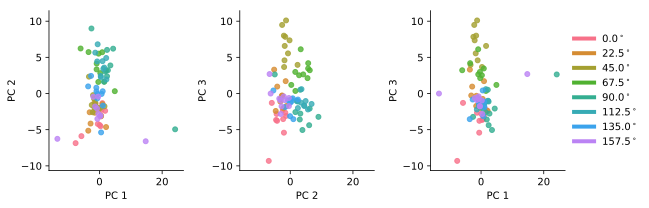

In [8]:
Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].mean(axis=1) for t in trials]).T

# or take the max
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].max(axis=1) for t in trials]).T

# or the baseline-corrected mean
#Xr = np.vstack([t[:, frames_pre_stim:-frames_post_stim].mean(axis=1) - t[:, 0:frames_pre_stim].mean(axis=1) for t in trials]).T

Xr_sc = z_score(Xr)

pca = PCA(n_components=15)
Xp = pca.fit_transform(Xr_sc.T).T

projections = [(0, 1), (1, 2), (0, 2)]
fig, axes = plt.subplots(1, 3, figsize=[9, 3], sharey='row', sharex='row')
for ax, proj in zip(axes, projections):
    for t, t_type in enumerate(trial_types):
        x = Xp[proj[0], t_type_ind[t]]
        y = Xp[proj[1], t_type_ind[t]]
        ax.scatter(x, y, c=pal[t], s=25, alpha=0.8)
        ax.set_xlabel('PC {}'.format(proj[0]+1))
        ax.set_ylabel('PC {}'.format(proj[1]+1))
sns.despine(fig=fig, top=True, right=True)
add_orientation_legend(axes[2])

It is clear that some of the PCA components are picking up differences between trial types (i.e. orientation). This is not surprising: we know that neurons in V1 are tuned to orientation, meaning that they respond preferentially to gratings inclined a certain angle, so we expect population responses to angles close to each other to be similar and close to each other in PCA space. This is true in particular for the second and third components (PC 2 and PC 3), whereas PC 1 seems to capture variance that is mostly not related to orientation tuning: as we move along the PC 1 axis we see no clear change in orientation. 

<a id='trialaveraged' ></a>
## Trial-averaged PCA

For the trial-averaged PCA, we first compute the trial averages for each trial type and concatenate them:

In [9]:
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
Xa = np.hstack(trial_averages)

We then fit and apply PCA to the resulting data matrix.

In [10]:
n_components = 15
Xa = z_score(Xa) #Xav_sc = center(Xav)
pca = PCA(n_components=n_components)
Xa_p = pca.fit_transform(Xa.T).T

And lastly we plot the data projected onto the first three components over time. To keep the example a bit simpler, I will only focus on the first three components in the tutorial, although of course it may be useful to consider more components as well, judging from their variance explained and their trajectories. 

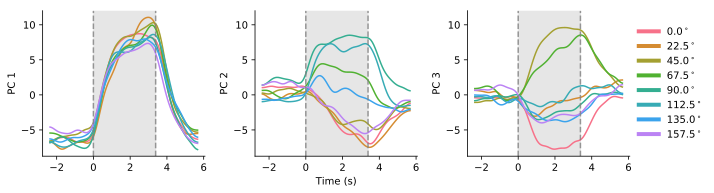

In [11]:
fig, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey='row')
for comp in range(3):
    ax = axes[comp]
    for kk, type in enumerate(trial_types):
        x = Xa_p[comp, kk * trial_size :(kk+1) * trial_size]
        x = gaussian_filter1d(x, sigma=3)
        ax.plot(time, x, c=pal[kk])
    add_stim_to_plot(ax)
    ax.set_ylabel('PC {}'.format(comp+1))
add_orientation_legend(axes[2])
axes[1].set_xlabel('Time (s)')
sns.despine(fig=fig, right=True, top=True)
plt.tight_layout(rect=[0, 0, 0.9, 1])

The first thing we notice is that differences in orientation are represented very well in the second and third components. The first component, on the other hand, appears to be mostly involved in a global transient (the trajectories for the different trial types are mostly overlapping). This is not so strange: while orientation tuning may be the characteristic of neural activity that we care about, it is quite likely that the main source of variance in the data is due to the fact that there is a stimulus _at all_. The sudden increase in luminance of the screen will elicit an overall increase in population activity, which is then modulated by the orientation. In my experience, it is not uncommon for the first or first few PCA components to capture changes in activity which do not depend on the specific trial type. 

At this point, it can be interesting to ask which units PCA combines to obtain these components. Since every component is nothing more than a linear combination of the neurons in the population (a vector which assigns a weight to each neuron). So we can ask __which units feature more prominently in a given component__ as a way to spot units with an interesting behavior[<sup>1</sup>](#footnote). 

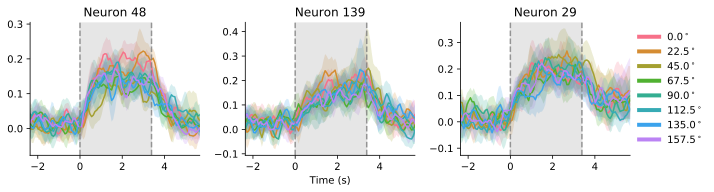

In [23]:
# find the indices of the three largest elements of the second eigenvector
units = np.abs(pca.components_[1, :].argsort())[::-1][0:3]

f, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey=False,
                       sharex=True)
for ax, unit in zip(axes, units):
    ax.set_title('Neuron {}'.format(unit))
    for t, ind in enumerate(t_type_ind):
        x = np.array(trials)[ind][:, unit, :]
        sns.tsplot(x, time=time,
                   ax=ax,
                   err_style='ci_band',
                   ci=95,
                   color=pal[t])
for ax in axes:
    add_stim_to_plot(ax)
axes[1].set_xlabel('Time (s)')
sns.despine(fig=f, right=True, top=True)
add_orientation_legend(axes[2])

<a id='trialconcatenated' ></a>
## Trial-concatenated PCA
For trial-concatenated PCA, we simply stack all the trials (the order doesn't matter).

In [11]:
Xl = np.hstack(trials)

We then standardize the resulting matrix `Xl`, and fit and apply PCA to it. 

In [12]:
Xl = z_score(Xl)
pca = PCA(n_components=15)
Xl_p = pca.fit_transform(Xl.T).T

Our projected data `Xl_p` is in the form of a $Q \times TK$ array (number of components by number of time points times number of trials). To plot the components, I rearrange it into a dictionary:

In [13]:
gt = {comp : {t_type : [] for t_type in trial_types} for comp in range(n_components)}

for comp in range(n_components):
    for i, t_type in enumerate(trial_type):
        t = Xl_p[comp, trial_size * i: trial_size * (i + 1)]
        gt[comp][t_type].append(t)

for comp in range(n_components):
    for t_type in trial_types:
        gt[comp][t_type] = np.vstack(gt[comp][t_type])

Now, accessing the dictionary as `gt[component][orientation]` returns an array of all trials of the selected orientation projected on the selected component. We then plot the projections of each trial on the first three components.

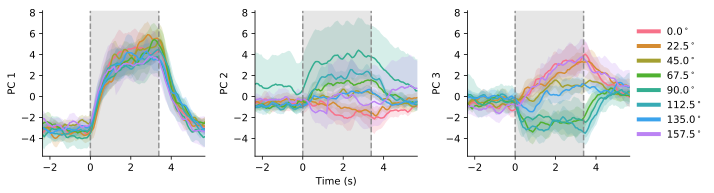

In [14]:
f, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey=True, sharex=True)
for comp in range(3):
    ax = axes[comp]
    for t, t_type in enumerate(trial_types):
        sns.tsplot(gt[comp][t_type], time=time, ax=ax,
                   err_style='ci_band',
                   ci=95,
                   color=pal[t])
    add_stim_to_plot(ax)
    ax.set_ylabel('PC {}'.format(comp+1))
axes[1].set_xlabel('Time (s)')
sns.despine(right=True, top=True)
add_orientation_legend(axes[2])

<a id='averagedconcatenated' ></a>
## Averaged-concatenated PCA

In principle, __trial-concatenated PCA is the most unsupervised option__, because PCA gets no information about the trial types that we have set up. It is only after we have reduced the dimensionality of the full data that we split trials up by type to compare them.  

Another added benefit is that we __perform dimensionality reduction at the level of single trials__. This allows to reason about differences between individual trials which may reflect trial-to-trial variations in attention, arousal, or other variables. Furthermore, in the trial-averaged PCA we only project the trial averages, so we don't really know if the trajectories of neural activity corresponding to two different stimuli are _actually_ different. In trial-concatenated PCA, by plotting confidence intervals, we can see to what extent the trajectories of different stimuli are overlapping, and get a measure of __trial-to-trial variability__. 

While this sounds great, in my experience this decomposition can be quite affected by noise. In fact, for the second component (PC 2), we see huge confidence intervals, meaning that the projections of different trials are largely overlapping across trial types. 

In the hybrid averaged-concatenated PCA, we fit PCA on trial averages, like in trial-averaged PCA, and project individual trials on the extracted principal components, like in trial-concatenated PCA. This allows for a __more powerful (and more supervised) decomposition__, more likely to retrieve a certain structure in the data the we are interested in, while at the same it __preserves single trial information__. 

The preprocessing needs a bit of attention here: in fact, it is important that we use the __same scaling transformation we apply to the trial averages for the individual trials__ (standardizing every trial independently would give us completely wonky results). 

In [15]:
# fit PCA on trial averages
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
Xav = np.hstack(trial_averages)

ss = StandardScaler(with_mean=True, with_std=True)
Xav_sc = ss.fit_transform(Xav.T).T
pca = PCA(n_components=15) 
pca.fit(Xav_sc.T) # only call the fit method

PCA(copy=True, iterated_power='auto', n_components=15, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [16]:
projected_trials = []
for trial in trials:
    # scale every trial using the same scaling applied to the averages 
    trial = ss.transform(trial.T).T
    # project every trial using the pca fit on averages
    proj_trial = pca.transform(trial.T).T
    projected_trials.append(proj_trial)

Again, I do a bit of rearranging of the projected data:

In [17]:
gt = {comp: {t_type: [] for t_type in trial_types}
      for comp in range(n_components)}

for comp in range(n_components):
    for i, t_type in enumerate(data['trial_type']):
        t = projected_trials[i][comp, :]
        gt[comp][t_type].append(t)

And again plot the trials over time on the first three components:

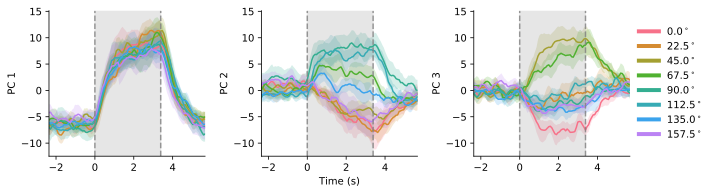

In [18]:
f, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey=True, sharex=True)
for comp in range(3):
    ax = axes[comp]
    for t, t_type in enumerate(trial_types):
        sns.tsplot(gt[comp][t_type], time=time, ax=ax,
                   err_style='ci_band',
                   ci=95,
                   color=pal[t])
    add_stim_to_plot(ax)
    ax.set_ylabel('PC {}'.format(comp+1))
axes[1].set_xlabel('Time (s)')
sns.despine(right=True, top=True)
add_orientation_legend(axes[2])

Now, as you can see, the separation between trials of different orientations projected on the second (and third) component is much better than in the trial-concatenated PCA, meaning that these components are better at capturing the orientation differences. This is not surprising: we have deliberately biased PCA towards this structure in the data (by fitting on trials averaged by orientation). But reducing the dimensionality of individual trials allows us to see whether this structure actually holds up at the level of single trials, or whether it is just an artifact of averaging. The fact that the projections of individual trials are actually well separated by trial type in PCA space is a good indication that this structure is present in the data.

<a id='visualization' ></a>
# Visualization
Armed with these tools, we can get creative on how we visualize our PCA decompositions.

<a id='animatedscatter' ></a>
## Animated scatter
The first plot of this tutorial, for the trial-response PCA, was a scatter plot, where each dot represents a trial in the space of the first two components. But we can do better than that! I will use the hybrid averaged-concatenated PCA (but the long form would work as well) to plot a dot per trial at every time point.

To generate the animation, I use the Matplotlib's `animation` module. The main idea is that we set up a figure and an empty scatter plot. Then we write a function (`animate`, in this case), which will get called at every iteration, and will replace the x and y position of the scatter plot with the x and y position of every trial in a PCA subspace at a given point in time. The animation is generated by calling the `FuncAnimation` method, which takes as input a figure and the animation function (plus some other parameters).

In [19]:
# import the animation and the HTML module to create and render the animation
from matplotlib import animation 
from IPython.display import HTML

# smooth the single projected trials 
for i in range(len(projected_trials)):
    for c in range(projected_trials[0].shape[0]):
        projected_trials[i][c, :] = gaussian_filter1d(projected_trials[i][c, :], sigma=3)

# for every time point (imaging frame) get the position in PCA space of every trial
pca_frame = []
for t in range(trial_size):
    # projected data for all trials at time t 
    Xp = np.hstack([tr[:, None, t] for tr in projected_trials]).T
    pca_frame.append(Xp)
    
subspace = (1, 2) # pick the subspace given by the second and third components
    
# set up the figure
fig, ax = plt.subplots(1, 1, figsize=[6, 6]); plt.close()
ax.set_xlim(( -16, 16))
ax.set_ylim((-16, 16))
ax.set_xlabel('PC 2')
ax.set_xticks([-10, 0, 10])
ax.set_yticks([-10, 0, 10])
ax.set_ylabel('PC 3')
sns.despine(fig=fig, top=True, right=True)

# generate empty scatter plot to be filled by data at every time point
scatters = []
for t, t_type in enumerate(trial_types):
    scatter, = ax.plot([], [], 'o', lw=2, color=pal[t]);
    scatters.append(scatter)

# red dot to indicate when stimulus is being presented
stimdot, = ax.plot([], [], 'o', c='r', markersize=35, alpha=0.5)

# annotate with stimulus and time information
text     = ax.text(6.3, 9, 'Stimulus OFF \nt = {:.2f}'.format(time[0]), fontdict={'fontsize':14})

# this is the function to be called at every animation frame
def animate(i):
    for t, t_type in enumerate(trial_types):
        # find the x and y position of all trials of a given type
        x = pca_frame[i][t_type_ind[t], subspace[0]]
        y = pca_frame[i][t_type_ind[t], subspace[1]]
        # update the scatter
        scatters[t].set_data(x, y)
        
    # update stimulus and time annotation
    if (i > frames_pre_stim) and (i < (trial_size-frames_post_stim)):
        stimdot.set_data(10, 14)
        text.set_text('Stimulus ON \nt = {:.2f}'.format(time[i]))
    else:
        stimdot.set_data([], [])
        text.set_text('Stimulus OFF \nt = {:.2f}'.format(time[i]))
    return (scatter,)

# generate the animation
anim = animation.FuncAnimation(fig, animate, 
                               frames=len(pca_frame), interval=80, 
                               blit=False)

HTML(anim.to_jshtml()) # render animation

Notice that I smoothed the projected trials: this prevents the dots in the scatter from jumping around, so we can visually trace the movement of each trial. 

<a id='trajectories' ></a>
## 3D PCA trajectories

So far, we have only looked at two-dimensional plots. But we can make use of 3D plots to visualize neural trajectories in the subspace identified by the first three components. Let's begin with a static plot, and then we'll animate it. Note that this plot uses the _trial-averaged_ PCA form. 

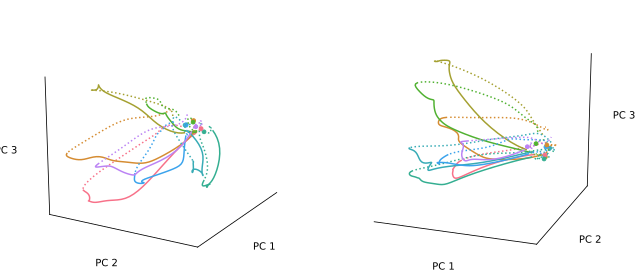

In [20]:
# prepare trial averages
trial_averages = []
for ind in t_type_ind:
    trial_averages.append(np.array(trials)[ind].mean(axis=0))
Xa = np.hstack(trial_averages)

# standardize and apply PCA
Xa = z_score(Xa) 
pca = PCA(n_components=3)
Xa_p = pca.fit_transform(Xa.T).T

# pick the components corresponding to the x, y, and z axes
component_x = 0
component_y = 1
component_z = 2

# create a boolean mask so we can plot activity during stimulus as 
# solid line, and pre and post stimulus as a dashed line
stim_mask = ~np.logical_and(np.arange(trial_size) >= frames_pre_stim,
               np.arange(trial_size) < (trial_size-frames_post_stim))

# utility function to clean up and label the axes
def style_3d_ax(ax):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

sigma = 3 # smoothing amount

# set up a figure with two 3d subplots, so we can have two different views
fig = plt.figure(figsize=[9, 4])
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
axs = [ax1, ax2]

for ax in axs:
    for t, t_type in enumerate(trial_types):

        # for every trial type, select the part of the component
        # which corresponds to that trial type:
        x = Xa_p[component_x, t * trial_size :(t+1) * trial_size]
        y = Xa_p[component_y, t * trial_size :(t+1) * trial_size]
        z = Xa_p[component_z, t * trial_size :(t+1) * trial_size]
        
        # apply some smoothing to the trajectories
        x = gaussian_filter1d(x, sigma=sigma)
        y = gaussian_filter1d(y, sigma=sigma)
        z = gaussian_filter1d(z, sigma=sigma)

        # use the mask to plot stimulus and pre/post stimulus separately
        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan

        ax.plot(x, y, z_stim, c = pal[t])
        ax.plot(x, y, z_prepost, c=pal[t], ls=':')
        
        # plot dots at initial point
        ax.scatter(x[0], y[0], z[0], c=pal[t], s=14)
        
        # make the axes a bit cleaner
        style_3d_ax(ax)
        
# specify the orientation of the 3d plot        
ax1.view_init(elev=22, azim=30)
ax2.view_init(elev=22, azim=110)
plt.tight_layout()

In these plots, the dot represents the beginning of the trajectory, solid lines indicate that the stimulus is being presented, whereas for time points before and after stimulus presentation I use dotted lines. Colors represent orientations, as before. 

We can see that trajectories start very close in this PCA subspace, then drift apart during stimulus presentation, and return close to the starting point after the stimulus has ended (like in the animated scatter). All trajectories undergo a similar route in the direction of the first component (from right to left, in the right-hand plot), and it is mostly the combination of second and third component which separates the trajectories based on their orientation.

<a id='animatedtrajectories' ></a>
## Animated PCA trajectories in 3D
Here we plot the same trajectories as in the previous figure, but this time we animate[<sup>2</sup>](#footnote) them. 

In [21]:
# apply some smoothing to the trajectories
for c in range(Xa_p.shape[0]):
    Xa_p[c, :] =  gaussian_filter1d(Xa_p[c, :], sigma=sigma)

# create the figure
fig = plt.figure(figsize=[9, 9]); plt.close()
ax = fig.add_subplot(1, 1, 1, projection='3d')

def animate(i):
    
    ax.clear() # clear up trajectories from previous iteration
    style_3d_ax(ax)
    ax.view_init(elev=22, azim=30)

    for t, t_type in enumerate(trial_types):
    
        x = Xa_p[component_x, t * trial_size :(t+1) * trial_size][0:i]
        y = Xa_p[component_y, t * trial_size :(t+1) * trial_size][0:i]
        z = Xa_p[component_z, t * trial_size :(t+1) * trial_size][0:i]
                
        stim_mask = ~np.logical_and(np.arange(z.shape[0]) >= frames_pre_stim,
                     np.arange(z.shape[0]) < (trial_size-frames_pre_stim))

        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan
        
        ax.plot(x, y, z_stim, c = pal[t])
        ax.plot(x, y, z_prepost, c=pal[t], ls=':')

    ax.set_xlim(( -8, 8))
    ax.set_ylim((-8, 8))
    ax.set_zlim((-6, 6))

    return []


anim = animation.FuncAnimation(fig, animate,
                               frames=len(pca_frame), interval=50, 
                               blit=True)

HTML(anim.to_jshtml(default_mode='once'))

<a id='animatedtrajectoriessingle' ></a>
## Animated PCA trajectories of single trials in 3D
An interesting variation is to plot the trajectories of individual trials. This will give us of course a messier tangle of trajectories, so I will only plot the first half of the trials).

I will use again the (smoothed) projected trials from the hybrid averaged-concatenated PCA, but the same visualization could be done for trial-concatenated PCA as well. 

In [22]:
# set up a dictionary to color each line
col = {trial_types[i] : pal[i] for i in range(len(trial_types))}


fig = plt.figure(figsize=[9, 9]); plt.close()
ax = fig.add_subplot(1, 1, 1, projection='3d')

def animate(i):
    
    ax.clear()
    style_3d_ax(ax)
    ax.view_init(elev=22, azim=30)
    for t, (trial, t_type) in enumerate(zip(projected_trials[0:40], trial_type[0:40])):
        
        x = trial[component_x, :][0:i]
        y = trial[component_y, :][0:i]
        z = trial[component_z, :][0:i]
        
        stim_mask = ~np.logical_and(np.arange(z.shape[0]) >= frames_pre_stim,
                     np.arange(z.shape[0]) < (trial_size-frames_pre_stim))

        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan
        
        ax.plot(x, y, z_stim, c = col[t_type])
        ax.plot(x, y, z_prepost, c=col[t_type], ls=':')

    ax.set_xlim(( -12, 12))
    ax.set_ylim((-12, 12))
    ax.set_zlim((-13, 13))
    ax.view_init(elev=22, azim=30)

    return []

anim = animation.FuncAnimation(fig, animate, frames=len(pca_frame), interval=50,blit=True)

HTML(anim.to_jshtml(default_mode='once'))

# Outro

I hope to have shown you some interesting ways in which you can use PCA to explore your data. As a last remark, I would like to remind you of some of the limitations of PCA (some of which may be less obvious than others):

- Trials must have (at least roughly) the same duration so that we can average them (for trial-averaged and averaged-concatenated PCA). For trial-concatenated PCA  equal duration is not a strict requirement, but it allows us to superimpose the single-trial trajectories for each trial type. For trial-response PCA this is not a problem, as we anyway compress away the time dimension. In situations where the trial length or the behavioral sequences differ, a time warping procedure can be used to stretch and align trials./
- PCA is only sensitive to zero time-lag correlations, which means that it cannot pick up sequential firing patterns. 
- We can only combine trials where we have the same neurons. For probe/tetrode recordings, this means that generally we are limited to running PCA on individual recording sessions. 

<a id='footnote' ></a>
<sup>1</sup> While I find this a nice way to always keep an eye on the raw single-cell data, there is a limit to how much we can interpret the subpopulations identified by the PCA components, due to the fact that the PCA solution suffers from the _rotation problem_, which means that you could perform a rotation of the components without changing the reconstruction error (in factor analysis, this is often used to identify more interpretable factors). If you are interested, this issue is discussed in the methods of [this paper](https://www.biorxiv.org/content/early/2017/10/30/211128) and [here](https://stats.stackexchange.com/questions/151653/what-is-the-intuitive-reason-behind-doing-rotations-in-factor-analysis-pca-how), otherwise just be careful not to over-interpret the meaning of the components.  

<sup>2</sup> For this animation, I actually everything at each iteration, instead of using `set_data`. This is a quick solution which allows me to plot the solid and dashed line, but of course it is a bit inefficient for bigger animations. If you want to use `set_data`, however, be reminded that at the time of writing a `set_data` method for 3D plots is [not yet implemented](https://github.com/matplotlib/matplotlib/issues/8914), which requires a bit of a workaround. 